In [1]:
import sys
import json
import base64
import numpy as np
from scipy import misc

import matplotlib.pyplot as plt
from pathlib import Path
import skvideo.io
import scipy.misc

from glob import glob
import os

In [2]:
PATH = Path.cwd()

In [3]:
DATA_PATH = Path('../data/test_sync')

### Moving data to sampl

In [5]:
source = glob(str(DATA_PATH/'*/*.png'))

In [8]:
TARG_PATH = Path('../data/sample_test_sync')

In [10]:
TARG_PATH.mkdir(exist_ok=True)
(TARG_PATH/f'CameraSeg').mkdir(exist_ok=True)
(TARG_PATH/f'CameraRGB').mkdir(exist_ok=True)
(TARG_PATH/f'CameraSeg-150').mkdir(exist_ok=True)
(TARG_PATH/f'CameraRGB-150').mkdir(exist_ok=True)
(TARG_PATH/f'CameraSeg-300').mkdir(exist_ok=True)
(TARG_PATH/f'CameraRGB-300').mkdir(exist_ok=True)

In [7]:
source[0]

'../data/test_sync/CameraSeg-150/653.png'

In [17]:
import shutil

In [18]:
source = glob(str(DATA_PATH/'*/*.png'))
for f in source:
    f_pt = Path(f).parts
    fn = f_pt[-1]
    skip = int(fn[-5])%3 != 0
    if skip: continue
    targ_path = TARG_PATH/f_pt[-2]/f_pt[-1]
    shutil.copy2(f, str(targ_path))

### Back to files

In [4]:
# file = sys.argv[-1]
file = '../data/la/test_video.mp4'
video = skvideo.io.vread(file)

In [5]:
# file = '../data/val_video.mp4'
# val_video = skvideo.io.vread(file)

In [6]:
from concurrent.futures import ProcessPoolExecutor, ThreadPoolExecutor
import imageio

In [7]:
def decode(packet):
	img = base64.b64decode(packet)
	filename = PATH/'image.png'
	with open(filename, 'wb') as f:
			f.write(img)
	result = imageio.imread(filename)
	return result

with open(PATH/'../data/la/results.json') as json_data:
	ans_data = json.loads(json_data.read())
	json_data.close()

frames_processed = 0

In [21]:
idx_m1 = list(range(15,44)) + list(range(200,750))

In [5]:
video.shape

(1000, 600, 800, 3)

In [6]:
PATH

PosixPath('/home/paperspace/lyft-perception-challenge/workspace/Example')

In [8]:
len(video), len(ans_data.keys())

(1000, 1000)

/home/paperspace/anaconda3/envs/lyft/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


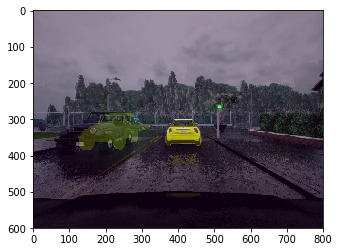

In [9]:
idx = 10
plt.figure()
plt.imshow(video[idx])
plt.imshow(decode(ans_data[str(idx)][0]), alpha=.2)
plt.show()

/home/paperspace/anaconda3/envs/lyft/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


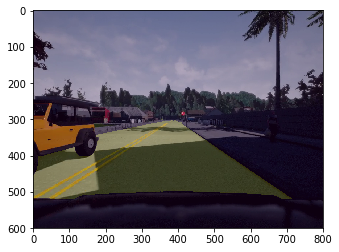

In [10]:
idx = 730
plt.figure()
plt.imshow(video[idx])
plt.imshow(decode(ans_data[str(idx)][1]), alpha=.2)
plt.show()

/home/paperspace/anaconda3/envs/lyft/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


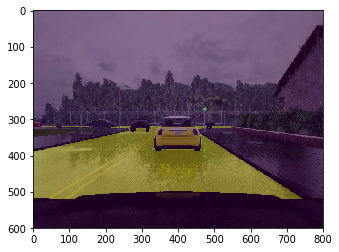

In [11]:
idx = 0
plt.figure()
plt.imshow(video[idx])
plt.imshow(decode(ans_data[str(idx+1)][1]), alpha=.4)
plt.show()

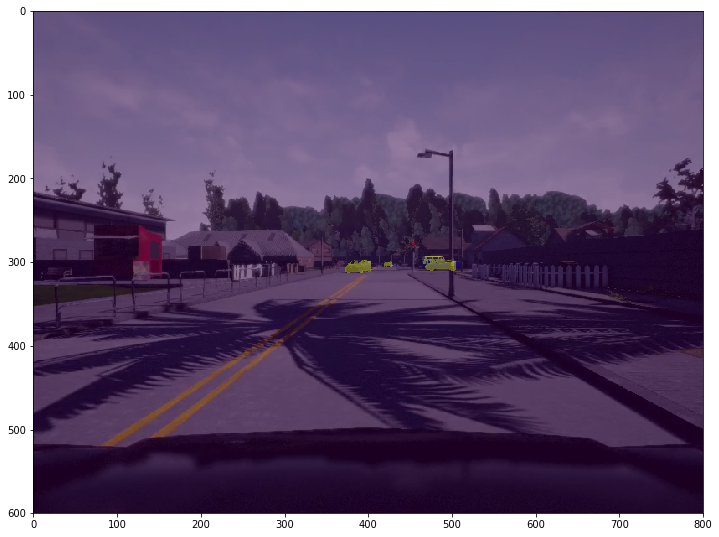

In [131]:
idx = 750
idx_a = idx if idx in idx_m1 else idx+1
plt.figure(figsize=(12, 16))
plt.imshow(video[idx])
plt.imshow(decode(ans_data[str(idx_a)][0]), alpha=.4)
plt.show()

In [18]:
c = decode(ans_data[str(30)][0])
r = decode(ans_data[str(30)][1])

In [8]:
VEHICLES=10
ROADS=7
ROAD_LINES=6

In [9]:
(DATA_PATH/f'CameraSeg').mkdir(exist_ok=True)
(DATA_PATH/f'CameraRGB').mkdir(exist_ok=True)

In [40]:
def process_frames(idx):
    if os.path.exists(DATA_PATH/f'CameraSeg/{idx}.png'):
        return
    vid_idx = idx if idx in idx_m1 else idx+1
    res = np.zeros_like(video[idx])
    c = decode(ans_data[str(vid_idx)][0])
    r = decode(ans_data[str(vid_idx)][1])
    res[c==True] = VEHICLES
    res[r==True] = ROADS
    imageio.imwrite(DATA_PATH/f'CameraSeg/{idx}.png', res)
    imageio.imwrite(DATA_PATH/f'CameraRGB/{idx}.png', video[idx])

In [41]:
# for idx in range(0,len(video)):
with ThreadPoolExecutor(6) as executor:
    executor.map(process_frames, range(len(video)))

In [144]:
len(glob(str(DATA_PATH/f'CameraSeg/*.png'))), len(glob(str(DATA_PATH/f'CameraRGB/*.png'))), 

(1000, 1000)

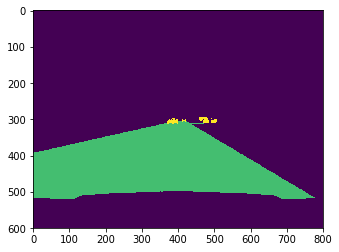

In [86]:
idx=749
plt.figure()
plt.imshow(plt.imread(str(DATA_PATH/f'CameraRGB/{idx}.png')))
plt.imshow(plt.imread(str(DATA_PATH/f'CameraSeg/{idx}.png'))[:,:,0], alpha=1)
plt.show()


### Mergeing images to show full video

In [11]:
MERGE_PATH = Path('../data/merge_sync')

In [12]:
MERGE_PATH.mkdir(exist_ok=True)
(MERGE_PATH/f'CameraSeg').mkdir(exist_ok=True)
(MERGE_PATH/f'CameraRGB').mkdir(exist_ok=True)

In [43]:
def process_overlay_frames(idx):
    if os.path.exists(MERGE_PATH/f'CameraSeg/{idx}.png'):
        return
    vid_idx = idx if idx in idx_m1 else idx+1
    res = np.zeros_like(video[idx])
    ans = decode(ans_data[str(vid_idx)]
    c = decode(ans[0])
    r = decode(ans[1])
    seg = np.dstack((res[:,:,0], c, r, (c | r))).astype(np.uint8) * 255
    imageio.imwrite(MERGE_PATH/f'CameraSeg/{idx}.png', seg)
    imageio.imwrite(MERGE_PATH/f'CameraRGB/{idx}.png', video[idx].astype(np.uint8))

In [132]:
process_overlay_frames(750)

In [22]:
with ProcessPoolExecutor(7) as executor:
    executor.map(process_overlay_frames, range(len(video)))

1
3
4
5
7
2
0
6
8
9
10
12
11
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [27]:
len(glob(str(MERGE_PATH/f'CameraSeg/*.png'))), len(glob(str(MERGE_PATH/f'CameraRGB/*.png'))), 

(1000, 1000)

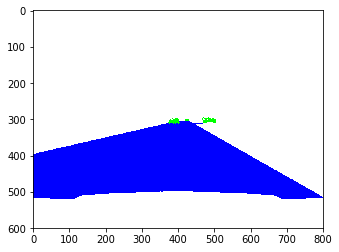

In [133]:
plt.imshow(plt.imread(str(MERGE_PATH/f'CameraSeg/750.png')))

In [135]:
(MERGE_PATH/'overlays').mkdir(exist_ok=True)

In [136]:
res = []
for i in range(1000):
    i1 = MERGE_PATH/f'CameraRGB/{i}.png'
    i2 = MERGE_PATH/f'CameraSeg/{i}.png'
    from PIL import Image
    # from IPython.display import Image

    background = Image.open(i1)
    overlay = Image.open(i2)

    background = background.convert("RGBA")
    overlay = overlay.convert("RGBA")

    new_img = Image.blend(background, overlay, 0.3)
    res.append(np.asarray(new_img))
    new_img.save(MERGE_PATH/f"overlays/{i}.png","PNG")

In [103]:
# i=150
# i1 = MERGE_PATH/f'CameraRGB/{i}.png'
# i2 = MERGE_PATH/f'CameraSeg/{i}.png'
# from PIL import Image
# # from IPython.display import Image

# background = Image.open(i1)
# overlay = Image.open(i2)

# background = background.convert("RGBA")
# overlay = overlay.convert("RGBA")

# new_img = Image.blend(background, overlay, 0.3)
# new_img.save(MERGE_PATH/f"overlays/{i}.png","PNG")

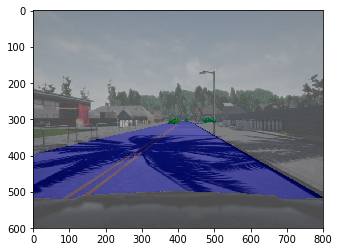

In [137]:
plt.imshow(plt.imread(str(MERGE_PATH/"overlays/750.png")))

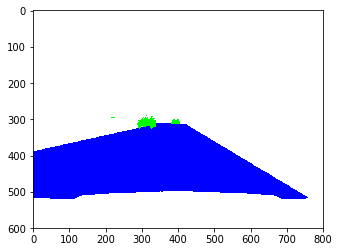

In [105]:
plt.imshow(plt.imread(str(i2)))

In [139]:
len(res)

1000

In [140]:
stacked_res = np.stack(res)

In [141]:
stacked_res.shape

(1000, 600, 800, 4)

In [143]:
skvideo.io.vwrite(MERGE_PATH/"merged_output.mp4", stacked_res)

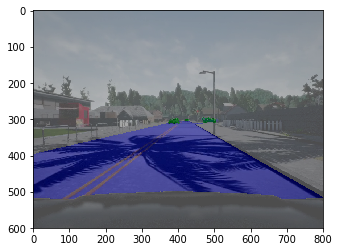

In [142]:
plt.imshow(stacked_res[750])

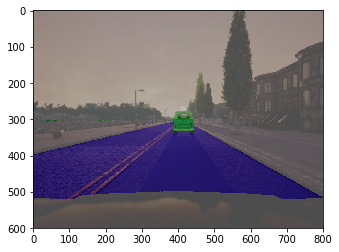

In [115]:
plt.imshow(np.asarray(new_img))

In [48]:
import io
import base64
from IPython.display import HTML

m_vid = io.open(MERGE_PATH/"merged_output.mp4", 'r+b').read()
encoded = base64.b64encode(m_vid)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))